# Unified Evaluation of Latent-Projection Duration

This notebook evaluates the oracle latent-state projection duration sweep against the original FYS-TDM baseline under one metric implementation. It separates localization quality, image preservation/edit activity, and human semantic judgments so that unlike quantities are not collapsed into one score.


## 1. Experimental Scope

- **Original FYS-TDM:** 12 unique seed-0 outputs. The three recorded seeds are pixel-identical and are not treated as independent samples.
- **Oracle latent projection:** 12 cases at every duration `N=0..13`, for 168 unique outputs.
- **Control:** `N=0` is the same target trajectory without latent projection. For `N>0`, GT-mask outside latents are projected onto the aligned source inversion state for `N` consecutive denoising steps beginning at step 2.
- **Important:** projection uses the GT mask. This tests the control operation, not automatic localization.


## 2. Metric Families

### 2.1 Localization Metrics

`binary_iou`, `soft_ap`, `pred_to_gt_area_ratio`, and `soft_inside_gt_mass` evaluate the predicted FYS-TDM mask. They are **not applicable** to oracle projection because its support is supplied by GT; assigning IoU=1 would be tautological.

### 2.2 Image Metrics

| Metric | Region | Direction | Interpretation |
|---|---|---|---|
| L1 / MSE | inside and outside GT | outside lower is better | Pixel change magnitude |
| PSNR | inside and outside GT | outside higher is better | Pixel fidelity |
| global SSIM proxy | inside and outside GT | outside higher is better | Selected-pixel structural/statistical similarity; same definition as notebooks 03/05 |
| LPIPS-Alex | outside GT | lower is better | Perceptual non-target change after neutralizing the GT interior |

Inside-region metrics measure **edit activity**, not whether the requested semantic edit succeeded.

### 2.3 Human Semantic Evaluation

- Local edit: `0` absent/incorrect, `1` partial, `2` clear requested edit.
- Non-target preservation: `0` major drift, `1` partial, `2` well preserved.
- Joint success: both scores `>=1`; strict joint success: both scores `=2`.


In [1]:
from __future__ import annotations

from pathlib import Path
import math

import numpy as np
import pandas as pd
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 180)


def find_repo_root(start: Path) -> Path:
    current = start.resolve()
    while current != current.parent:
        if (current / "pyproject.toml").exists() and (current / "core").exists():
            return current
        current = current.parent
    raise FileNotFoundError(f"Could not find repository root from {start}")


REPO_ROOT = find_repo_root(Path.cwd())
EVAL_DIR = REPO_ROOT / "core/results/control_operations_eval/latent_projection_all_cases_n0_n13"
UNIFIED_METRICS_PATH = EVAL_DIR / "unified_image_metrics.csv"
PROJECTION_HUMAN_PATH = EVAL_DIR / "manual_review_scores.csv"
FYS_METRICS_PATH = REPO_ROOT / "core/results/controlled_revision/fys_run_metrics.csv"
FYS_HUMAN_PATH = REPO_ROOT / "core/results/controlled_revision/manual_review_template.csv"

print("repo:", REPO_ROOT)
print("evaluation directory:", EVAL_DIR)


repo: /Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting
evaluation directory: /Users/pt623/Documents/career-vault-resume/applications/hkust-harry-yang/part-level-overediting/core/results/control_operations_eval/latent_projection_all_cases_n0_n13


## 3. Data Audit

In [2]:
required = [UNIFIED_METRICS_PATH, PROJECTION_HUMAN_PATH, FYS_METRICS_PATH, FYS_HUMAN_PATH]
missing = [path for path in required if not path.exists()]
if missing:
    raise FileNotFoundError("Missing required inputs: " + ", ".join(map(str, missing)))

metrics = pd.read_csv(UNIFIED_METRICS_PATH)
projection_human = pd.read_csv(PROJECTION_HUMAN_PATH)
fys_metrics_all = pd.read_csv(FYS_METRICS_PATH)
fys_human_all = pd.read_csv(FYS_HUMAN_PATH)

assert len(metrics) == 180, f"Expected 180 unified image rows, found {len(metrics)}"
assert metrics["row_uid"].nunique() == 180
assert (metrics["method"] == "original_fys").sum() == 12
assert (metrics["method"] == "latent_projection").sum() == 168
assert metrics.loc[metrics["method"] == "latent_projection", "duration"].dropna().astype(int).nunique() == 14

metric_columns = [
    "outside_mask_l1_aux", "inside_mask_l1_aux",
    "outside_mask_mse", "inside_mask_mse",
    "outside_mask_psnr", "inside_mask_psnr",
    "outside_mask_global_ssim", "inside_mask_global_ssim",
    "outside_mask_lpips",
]
non_lpips_missing = metrics[[column for column in metric_columns if column != "outside_mask_lpips"]].isna().sum().sum()
lpips_count = pd.to_numeric(metrics["outside_mask_lpips"], errors="coerce").notna().sum()
assert non_lpips_missing == 0, "Unified non-LPIPS metrics are incomplete"

audit = pd.DataFrame({
    "item": ["FYS unique outputs", "projection outputs", "durations", "non-LPIPS complete", "LPIPS complete"],
    "value": [12, 168, "0-13", "180/180", f"{lpips_count}/180"],
})
display(audit)
if lpips_count < len(metrics):
    display(Markdown(
        f"**LPIPS pending:** `{len(metrics) - lpips_count}` rows are missing. Run the unified evaluator on the GPU server with "
        "`--lpips require`, download the CSV, then rerun this notebook. Existing values are never cleared by a local `--lpips off` run."
    ))


,item,value
0,FYS unique outputs,12
1,projection outputs,168
2,durations,0-13
3,non-LPIPS complete,180/180
4,LPIPS complete,180/180


## 4. Localization Metrics: FYS-TDM Only

In [3]:
localization_columns = ["binary_iou", "soft_ap", "pred_to_gt_area_ratio", "soft_inside_gt_mass"]
fys_localization = fys_metrics_all[pd.to_numeric(fys_metrics_all["seed"], errors="coerce") == 0].copy()
fys_localization = fys_localization.drop_duplicates("case_uid")
assert len(fys_localization) == 12

localization_summary = fys_localization[localization_columns].agg(["mean", "std", "median"]).T
localization_summary.to_csv(EVAL_DIR / "fys_localization_summary.csv")
display(localization_summary.round(3))
display(Markdown(
    "Oracle latent projection is marked **N/A** here: it consumes the GT mask and therefore does not estimate localization. "
    "These FYS values document the localization bottleneck that the oracle-control study intentionally removes."
))


,mean,std,median
binary_iou,0.172,0.142,0.141
soft_ap,0.240,0.176,0.218
pred_to_gt_area_ratio,8.525,8.959,5.628
soft_inside_gt_mass,0.136,0.130,0.114


Oracle latent projection is marked **N/A** here: it consumes the GT mask and therefore does not estimate localization. These FYS values document the localization bottleneck that the oracle-control study intentionally removes.

## 5. Unified Image Preservation and Edit-Activity Metrics

,duration,n_cases,outside_mask_l1_aux,inside_mask_l1_aux,outside_mask_mse,inside_mask_mse,outside_mask_psnr,inside_mask_psnr,outside_mask_global_ssim,inside_mask_global_ssim,outside_mask_lpips
0,FYS,12.0,0.0555,0.1170,0.0099,0.0295,20.3598,16.0536,0.9192,0.6142,0.1914
1,0,12.0,0.0679,0.1215,0.0122,0.0307,19.4560,15.8014,0.8977,0.6004,0.2844
2,1,12.0,0.0502,0.1045,0.0068,0.0235,22.0673,17.0593,0.9387,0.6868,0.2206
3,2,12.0,0.0418,0.0927,0.0048,0.0191,23.6553,18.1565,0.9576,0.7479,0.1876
4,3,12.0,0.0369,0.0895,0.0038,0.0180,24.7170,18.1359,0.9657,0.7523,0.1615
5,4,12.0,0.0329,0.0883,0.0031,0.0179,25.8041,18.1748,0.9724,0.7508,0.1394
6,5,12.0,0.0295,0.0866,0.0025,0.0175,26.7896,18.3074,0.9774,0.7570,0.1124
7,6,12.0,0.0269,0.0855,0.0021,0.0172,27.6531,18.4049,0.9815,0.7615,0.0970
8,7,12.0,0.0248,0.0844,0.0018,0.0169,28.4205,18.4707,0.9843,0.7662,0.0823
9,8,12.0,0.0226,0.0834,0.0015,0.0166,29.2068,18.5540,0.9871,0.7710,0.0677


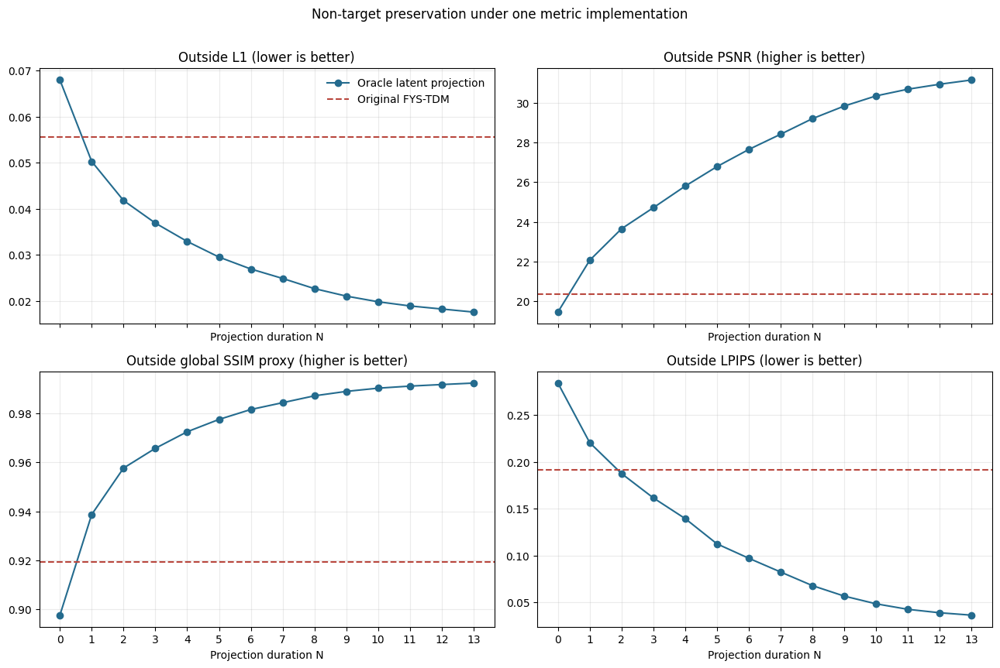

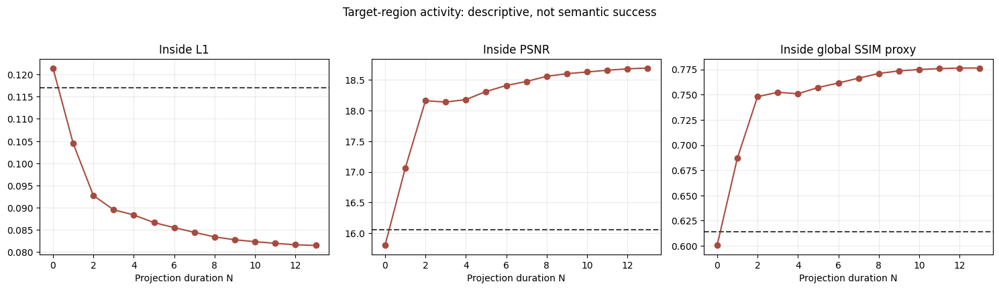

In [4]:
projection = metrics[metrics["method"] == "latent_projection"].copy()
projection["duration"] = projection["duration"].astype(int)
fys = metrics[metrics["method"] == "original_fys"].copy()

summary_agg = {
    "case_uid": "count",
    "outside_mask_l1_aux": "mean", "inside_mask_l1_aux": "mean",
    "outside_mask_mse": "mean", "inside_mask_mse": "mean",
    "outside_mask_psnr": "mean", "inside_mask_psnr": "mean",
    "outside_mask_global_ssim": "mean", "inside_mask_global_ssim": "mean",
    "outside_mask_lpips": "mean",
}
projection_summary = projection.groupby("duration", sort=True).agg(summary_agg).rename(columns={"case_uid": "n_cases"}).reset_index()
fys_summary = fys.agg(summary_agg).to_frame().T
fys_summary.insert(0, "duration", "FYS")
fys_summary = fys_summary.rename(columns={"case_uid": "n_cases"})
unified_summary = pd.concat([fys_summary, projection_summary], ignore_index=True)
unified_summary.to_csv(EVAL_DIR / "unified_image_metrics_summary.csv", index=False)
display(unified_summary.round(4))

fig, axes = plt.subplots(2, 2, figsize=(13, 8.5), sharex=True)
plots = [
    ("outside_mask_l1_aux", "Outside L1 (lower is better)"),
    ("outside_mask_psnr", "Outside PSNR (higher is better)"),
    ("outside_mask_global_ssim", "Outside global SSIM proxy (higher is better)"),
    ("outside_mask_lpips", "Outside LPIPS (lower is better)"),
]
for ax, (column, title) in zip(axes.ravel(), plots):
    ax.plot(projection_summary["duration"], projection_summary[column], marker="o", color="#246b8e", label="Oracle latent projection")
    baseline = pd.to_numeric(fys[column], errors="coerce").mean()
    if np.isfinite(baseline):
        ax.axhline(baseline, color="#b9473e", linestyle="--", label="Original FYS-TDM")
    ax.set(title=title, xlabel="Projection duration N")
    ax.set_xticks(range(14))
    ax.grid(alpha=0.25)
axes[0, 0].legend(frameon=False)
fig.suptitle("Non-target preservation under one metric implementation", y=1.01)
fig.tight_layout()
image_metric_curve = EVAL_DIR / "unified_image_metric_curves.png"
fig.savefig(image_metric_curve, dpi=180, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4.2))
for ax, column, title in [
    (axes[0], "inside_mask_l1_aux", "Inside L1"),
    (axes[1], "inside_mask_psnr", "Inside PSNR"),
    (axes[2], "inside_mask_global_ssim", "Inside global SSIM proxy"),
]:
    ax.plot(projection_summary["duration"], projection_summary[column], marker="o", color="#a84b3e")
    ax.axhline(pd.to_numeric(fys[column], errors="coerce").mean(), color="#444444", linestyle="--")
    ax.set(title=title, xlabel="Projection duration N")
    ax.set_xticks(range(0, 14, 2))
    ax.grid(alpha=0.25)
fig.suptitle("Target-region activity: descriptive, not semantic success", y=1.02)
fig.tight_layout()
inside_curve = EVAL_DIR / "unified_inside_activity_curves.png"
fig.savefig(inside_curve, dpi=180, bbox_inches="tight")
plt.show()


## 6. Human Semantic Evaluation

,duration,n_scored,local_edit_mean,preservation_mean,local_edit_clear_rate,preservation_clear_rate,joint_success_rate,strict_joint_success_rate
0,FYS,12.0,1.000,0.917,0.417,0.250,0.417,0.083
1,0,12.0,1.083,1.000,0.417,0.333,0.417,0.167
2,1,12.0,1.083,1.333,0.417,0.500,0.500,0.250
3,2,12.0,1.167,1.667,0.500,0.667,0.667,0.417
4,3,12.0,1.167,1.833,0.417,0.833,0.750,0.417
5,4,12.0,1.083,1.833,0.417,0.833,0.667,0.417
6,5,12.0,1.000,1.917,0.417,0.917,0.583,0.417
7,6,12.0,1.000,1.917,0.417,0.917,0.583,0.417
8,7,12.0,1.000,1.917,0.417,0.917,0.583,0.417
9,8,12.0,1.000,1.917,0.417,0.917,0.583,0.417


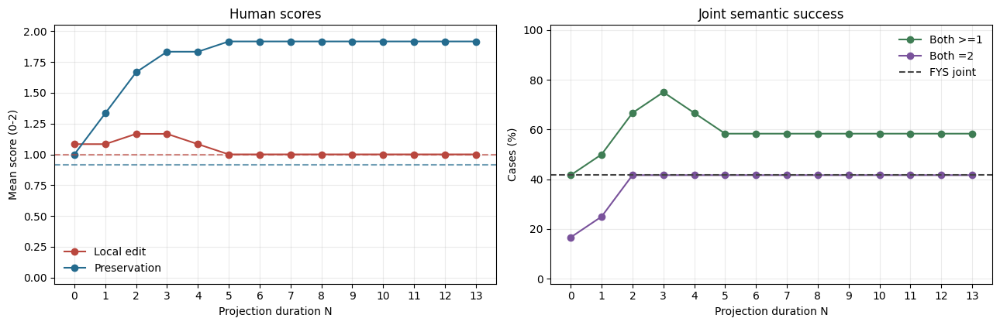

In [5]:
score_columns = ["local_edit_success_0_2", "non_target_preservation_0_2"]
for column in score_columns:
    projection_human[column] = pd.to_numeric(projection_human[column], errors="coerce")

fys_human = fys_human_all[pd.to_numeric(fys_human_all["seed"], errors="coerce") == 0].drop_duplicates("case_uid").copy()
fys_human = fys_human.rename(columns={
    "outside_preservation_0_2": "non_target_preservation_0_2",
})
for column in score_columns:
    fys_human[column] = pd.to_numeric(fys_human[column], errors="coerce")


def summarize_human(group: pd.DataFrame) -> pd.Series:
    valid = group.dropna(subset=score_columns)
    local = valid["local_edit_success_0_2"]
    preservation = valid["non_target_preservation_0_2"]
    return pd.Series({
        "n_scored": len(valid),
        "local_edit_mean": local.mean(),
        "preservation_mean": preservation.mean(),
        "local_edit_clear_rate": (local == 2).mean(),
        "preservation_clear_rate": (preservation == 2).mean(),
        "joint_success_rate": ((local >= 1) & (preservation >= 1)).mean(),
        "strict_joint_success_rate": ((local == 2) & (preservation == 2)).mean(),
    })


projection_human_summary = projection_human.groupby("duration", sort=True).apply(summarize_human, include_groups=False).reset_index()
fys_human_summary = summarize_human(fys_human).to_frame().T
fys_human_summary.insert(0, "duration", "FYS")
human_summary = pd.concat([fys_human_summary, projection_human_summary], ignore_index=True)
human_summary.to_csv(EVAL_DIR / "unified_human_summary.csv", index=False)
display(human_summary.round(3))

fig, axes = plt.subplots(1, 2, figsize=(13, 4.3))
axes[0].plot(projection_human_summary["duration"], projection_human_summary["local_edit_mean"], marker="o", label="Local edit", color="#b9473e")
axes[0].plot(projection_human_summary["duration"], projection_human_summary["preservation_mean"], marker="o", label="Preservation", color="#246b8e")
axes[0].axhline(fys_human["local_edit_success_0_2"].mean(), color="#b9473e", linestyle="--", alpha=0.65)
axes[0].axhline(fys_human["non_target_preservation_0_2"].mean(), color="#246b8e", linestyle="--", alpha=0.65)
axes[0].set(title="Human scores", xlabel="Projection duration N", ylabel="Mean score (0-2)", ylim=(-0.05, 2.05))
axes[0].set_xticks(range(14)); axes[0].grid(alpha=0.25); axes[0].legend(frameon=False)

axes[1].plot(projection_human_summary["duration"], 100 * projection_human_summary["joint_success_rate"], marker="o", color="#3f7d54", label="Both >=1")
axes[1].plot(projection_human_summary["duration"], 100 * projection_human_summary["strict_joint_success_rate"], marker="o", color="#79529b", label="Both =2")
axes[1].axhline(100 * (((fys_human[score_columns[0]] >= 1) & (fys_human[score_columns[1]] >= 1)).mean()), color="#444444", linestyle="--", label="FYS joint")
axes[1].set(title="Joint semantic success", xlabel="Projection duration N", ylabel="Cases (%)", ylim=(-2, 102))
axes[1].set_xticks(range(14)); axes[1].grid(alpha=0.25); axes[1].legend(frameon=False)
fig.tight_layout()
human_curve = EVAL_DIR / "unified_human_metric_curves.png"
fig.savefig(human_curve, dpi=180, bbox_inches="tight")
plt.show()


## 7. Compact FYS vs Projection Comparison

In [6]:
KEY_DURATIONS = [0, 2, 3, 5, 13]
image_key = unified_summary[(unified_summary["duration"] == "FYS") | (unified_summary["duration"].isin(KEY_DURATIONS))].copy()
human_key = human_summary[(human_summary["duration"] == "FYS") | (human_summary["duration"].isin(KEY_DURATIONS))].copy()
compact = image_key.merge(human_key, on="duration", suffixes=("_image", "_human"), validate="one_to_one")
compact["method"] = compact["duration"].map(lambda value: "Original FYS-TDM" if value == "FYS" else f"Oracle projection N={int(value)}")
compact_columns = [
    "method", "outside_mask_l1_aux", "outside_mask_psnr", "outside_mask_global_ssim", "outside_mask_lpips",
    "inside_mask_l1_aux", "local_edit_mean", "preservation_mean", "joint_success_rate", "strict_joint_success_rate",
]
compact = compact[compact_columns]
compact.to_csv(EVAL_DIR / "fys_vs_projection_key_durations.csv", index=False)
display(compact.round(3))

display(Markdown(
    "Read this table in two blocks: outside-region metrics quantify preservation; inside-region L1 only quantifies how much changed. "
    "The human local-edit score determines whether that change actually realizes the requested semantic edit."
))


,method,outside_mask_l1_aux,outside_mask_psnr,outside_mask_global_ssim,outside_mask_lpips,inside_mask_l1_aux,local_edit_mean,preservation_mean,joint_success_rate,strict_joint_success_rate
0,Original FYS-TDM,0.056,20.360,0.919,0.191,0.117,1.000,0.917,0.417,0.083
1,Oracle projection N=0,0.068,19.456,0.898,0.284,0.121,1.083,1.000,0.417,0.167
2,Oracle projection N=2,0.042,23.655,0.958,0.188,0.093,1.167,1.667,0.667,0.417
3,Oracle projection N=3,0.037,24.717,0.966,0.162,0.090,1.167,1.833,0.750,0.417
4,Oracle projection N=5,0.029,26.790,0.977,0.112,0.087,1.000,1.917,0.583,0.417
5,Oracle projection N=13,0.018,31.155,0.992,0.036,0.081,1.000,1.917,0.583,0.417


Read this table in two blocks: outside-region metrics quantify preservation; inside-region L1 only quantifies how much changed. The human local-edit score determines whether that change actually realizes the requested semantic edit.

## 8. Part-Size and Per-Case Analysis

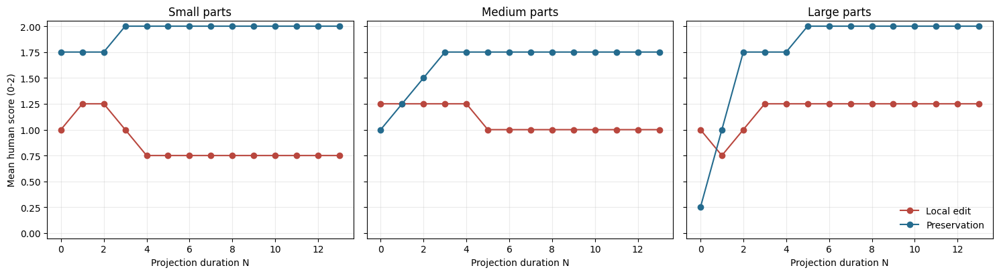

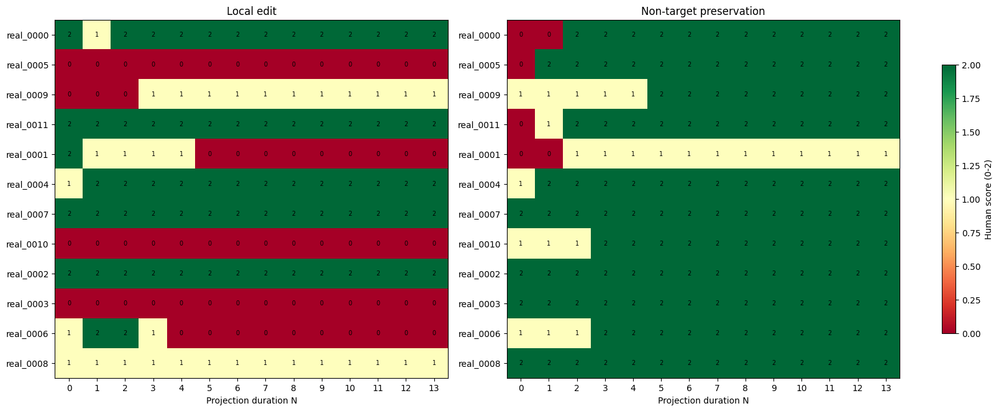

In [7]:
part_order = ["small", "medium", "large"]
projection_with_human = projection.merge(
    projection_human[["case_uid", "duration", *score_columns]],
    on=["case_uid", "duration"], how="left", validate="one_to_one",
)
by_size = projection_with_human.groupby(["part_size", "duration"], observed=True).agg(
    n_cases=("case_uid", "count"),
    outside_l1=("outside_mask_l1_aux", "mean"),
    outside_ssim=("outside_mask_global_ssim", "mean"),
    outside_lpips=("outside_mask_lpips", "mean"),
    local_edit=("local_edit_success_0_2", "mean"),
    preservation=("non_target_preservation_0_2", "mean"),
).reset_index()
by_size.to_csv(EVAL_DIR / "unified_metrics_by_part_size.csv", index=False)

fig, axes = plt.subplots(1, 3, figsize=(15, 4.2), sharey=True)
for ax, part_size in zip(axes, part_order):
    subset = by_size[by_size["part_size"] == part_size]
    ax.plot(subset["duration"], subset["local_edit"], marker="o", color="#b9473e", label="Local edit")
    ax.plot(subset["duration"], subset["preservation"], marker="o", color="#246b8e", label="Preservation")
    ax.set(title=f"{part_size.capitalize()} parts", xlabel="Projection duration N", ylim=(-0.05, 2.05))
    ax.set_xticks(range(0, 14, 2)); ax.grid(alpha=0.25)
axes[0].set_ylabel("Mean human score (0-2)")
axes[-1].legend(frameon=False)
fig.tight_layout()
part_size_curve = EVAL_DIR / "unified_human_by_part_size.png"
fig.savefig(part_size_curve, dpi=180, bbox_inches="tight")
plt.show()

case_order = projection_human[["case_uid", "part", "edit", "part_size"]].drop_duplicates().sort_values(["part_size", "case_uid"])["case_uid"].tolist()
local_matrix = projection_human.pivot(index="case_uid", columns="duration", values="local_edit_success_0_2").reindex(case_order)
preservation_matrix = projection_human.pivot(index="case_uid", columns="duration", values="non_target_preservation_0_2").reindex(case_order)
fig, axes = plt.subplots(1, 2, figsize=(16, 6.5), constrained_layout=True)
for ax, matrix, title in [(axes[0], local_matrix, "Local edit"), (axes[1], preservation_matrix, "Non-target preservation")]:
    image = ax.imshow(matrix, cmap="RdYlGn", vmin=0, vmax=2, aspect="auto")
    ax.set(title=title, xlabel="Projection duration N")
    ax.set_xticks(range(14), labels=range(14)); ax.set_yticks(range(len(case_order)), labels=case_order)
    for row in range(matrix.shape[0]):
        for column in range(matrix.shape[1]):
            value = matrix.iloc[row, column]
            ax.text(column, row, "-" if pd.isna(value) else str(int(value)), ha="center", va="center", fontsize=7)
fig.colorbar(image, ax=axes, shrink=0.75, label="Human score (0-2)")
per_case_curve = EVAL_DIR / "unified_per_case_human_scores.png"
fig.savefig(per_case_curve, dpi=180, bbox_inches="tight")
plt.show()


## 9. Qualitative Comparison

### Small parts

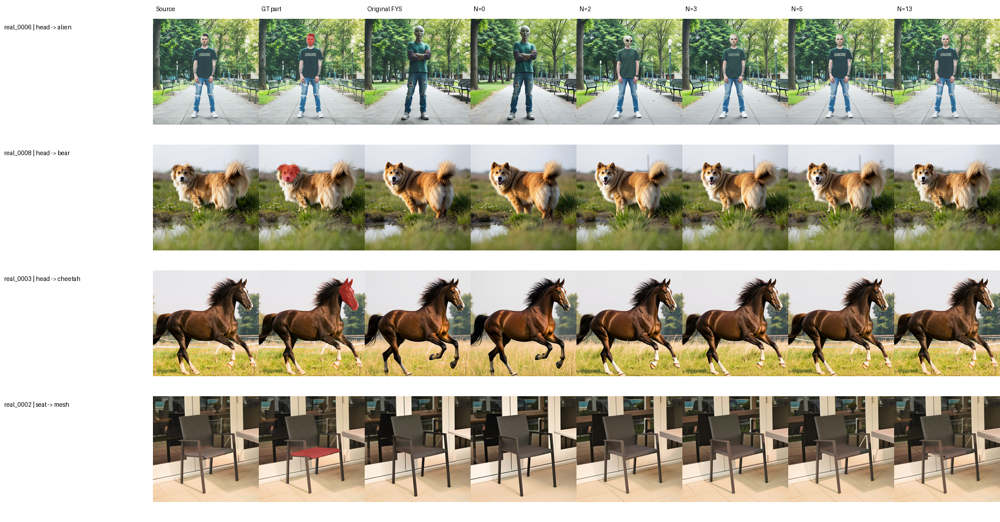

### Medium parts

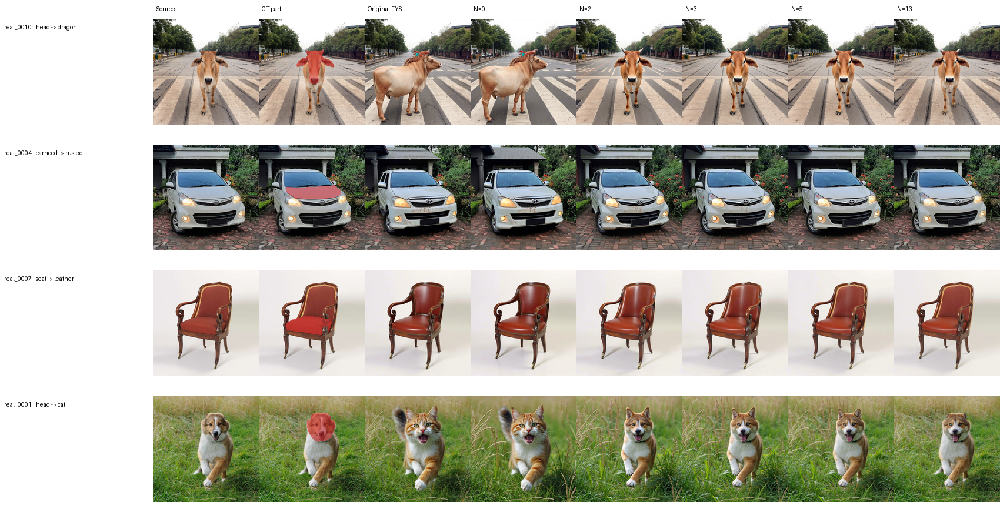

### Large parts

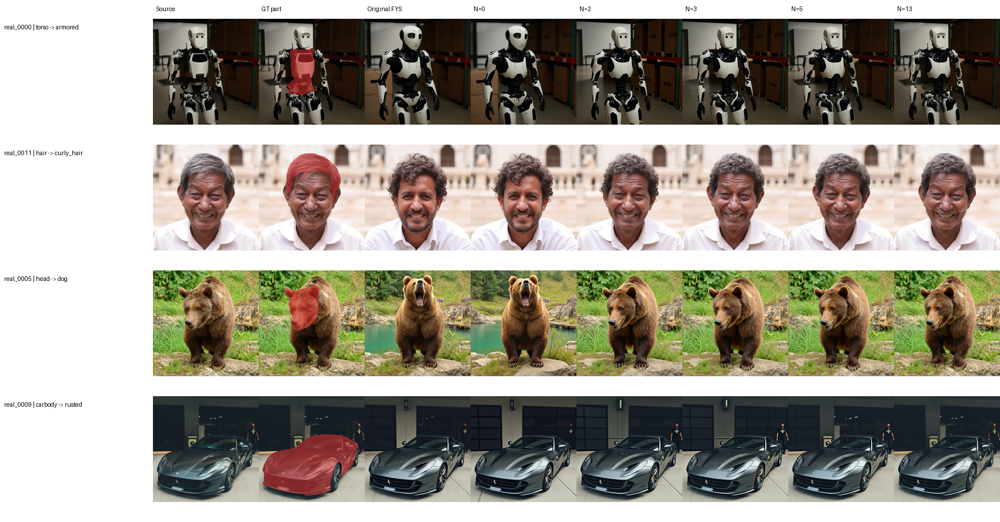

In [8]:
QUALITATIVE_DURATIONS = [0, 2, 3, 5, 13]


def resolve_repo_path(value: str | Path) -> Path:
    path = Path(value)
    return path if path.is_absolute() else REPO_ROOT / path


def load_pil(path: Path, size: tuple[int, int]) -> Image.Image:
    return Image.open(path).convert("RGB").resize(size, Image.Resampling.LANCZOS)


def overlay_gt(source_path: Path, mask_path: Path, size: tuple[int, int]) -> Image.Image:
    source = load_pil(source_path, size).convert("RGBA")
    mask = Image.open(mask_path).convert("L").resize(size, Image.Resampling.NEAREST)
    color = Image.new("RGBA", size, (220, 45, 45, 0)); color.putalpha(mask.point(lambda value: int(value * 0.55)))
    return Image.alpha_composite(source, color).convert("RGB")


def qualitative_sheet(part_size: str, thumb=(180, 180)) -> Image.Image:
    cases = projection_human[projection_human["part_size"] == part_size].drop_duplicates("case_uid")
    columns = ["Source", "GT part", "Original FYS", *[f"N={n}" for n in QUALITATIVE_DURATIONS]]
    text_width, header_height, row_height = 260, 32, thumb[1] + 34
    canvas = Image.new("RGB", (text_width + len(columns) * thumb[0], header_height + len(cases) * row_height), "white")
    draw = ImageDraw.Draw(canvas); font = ImageFont.load_default()
    for index, label in enumerate(columns):
        draw.text((text_width + index * thumb[0] + 5, 9), label, fill="black", font=font)
    for row_index, case in enumerate(cases.itertuples()):
        y = header_height + row_index * row_height
        draw.text((7, y + 8), f"{case.case_uid} | {case.part} -> {case.edit}", fill="black", font=font)
        source_row = projection[(projection["case_uid"] == case.case_uid)].iloc[0]
        source_path, gt_path = resolve_repo_path(source_row.source_image), resolve_repo_path(source_row.gt_mask)
        fys_path = resolve_repo_path(fys[fys["case_uid"] == case.case_uid].iloc[0].edited_image)
        panels = [load_pil(source_path, thumb), overlay_gt(source_path, gt_path, thumb), load_pil(fys_path, thumb)]
        for duration in QUALITATIVE_DURATIONS:
            path = resolve_repo_path(projection[(projection["case_uid"] == case.case_uid) & (projection["duration"] == duration)].iloc[0].edited_image)
            panels.append(load_pil(path, thumb))
        for column_index, panel in enumerate(panels):
            canvas.paste(panel, (text_width + column_index * thumb[0], y))
    return canvas


for part_size in ["small", "medium", "large"]:
    display(Markdown(f"### {part_size.capitalize()} parts"))
    sheet = qualitative_sheet(part_size)
    path = EVAL_DIR / f"unified_qualitative_{part_size}.jpg"
    sheet.save(path, quality=94)
    display(sheet)


## 10. Conclusions

In [9]:
projection_human_complete = projection_human.dropna(subset=score_columns)
best_joint = projection_human_summary.loc[projection_human_summary["joint_success_rate"].idxmax()]
best_local = projection_human_summary.loc[projection_human_summary["local_edit_mean"].idxmax()]
n0_metrics = projection_summary.loc[projection_summary["duration"] == 0].iloc[0]
n13_metrics = projection_summary.loc[projection_summary["duration"] == 13].iloc[0]
outside_reduction = 1 - n13_metrics.outside_mask_l1_aux / n0_metrics.outside_mask_l1_aux

display(Markdown(f'''### Evidence-supported findings

1. **Projection strongly improves measured non-target preservation.** Outside L1 falls by `{outside_reduction:.1%}` from N=0 to N=13; PSNR and SSIM move in the consistent direction.
2. **Preservation alone is not editing success.** Increasing N also suppresses inside-region activity, so the human local-edit rubric remains necessary.
3. **The observed semantic compromise occurs at an intermediate duration.** The highest joint-success rate is N={int(best_joint.duration)} (`{best_joint.joint_success_rate:.0%}`), while the highest mean local-edit score is N={int(best_local.duration)} (`{best_local.local_edit_mean:.3f}/2`).
4. **Original FYS and projection answer different diagnostic questions.** FYS-TDM localization remains imperfect; projection removes that variable with an oracle mask and tests whether stronger state-level control improves preservation and semantic editing.
5. **The result supports a control-operation bottleneck, not a complete solution.** Oracle projection can protect non-target content, but persistent low local-edit scores show that a spatially exact constraint does not guarantee the requested part semantics.

### Recommended locked comparison

Carry forward Original FYS-TDM, N=0, N=2, N=3, and N=5. Treat N=2/N=3 as primary candidates and N=5 as a preservation-dominant ablation. All projection outputs have complete human assessments.
'''))


### Evidence-supported findings

1. **Projection strongly improves measured non-target preservation.** Outside L1 falls by `74.2%` from N=0 to N=13; PSNR and SSIM move in the consistent direction.
2. **Preservation alone is not editing success.** Increasing N also suppresses inside-region activity, so the human local-edit rubric remains necessary.
3. **The observed semantic compromise occurs at an intermediate duration.** The highest joint-success rate is N=3 (`75%`), while the highest mean local-edit score is N=2 (`1.167/2`).
4. **Original FYS and projection answer different diagnostic questions.** FYS-TDM localization remains imperfect; projection removes that variable with an oracle mask and tests whether stronger state-level control improves preservation and semantic editing.
5. **The result supports a control-operation bottleneck, not a complete solution.** Oracle projection can protect non-target content, but persistent low local-edit scores show that a spatially exact constraint does not guarantee the requested part semantics.

### Recommended locked comparison

Carry forward Original FYS-TDM, N=0, N=2, N=3, and N=5. Treat N=2/N=3 as primary candidates and N=5 as a preservation-dominant ablation. All projection outputs have complete human assessments.


## 11. Limitations

- The pilot contains 12 cases and one human reviewer.
- Human assessments are complete for all 168 projection outputs.
- The generation pipeline is deterministic, so the three configured seeds do not provide uncertainty estimates.
- The global SSIM value is the repository's selected-pixel proxy, not windowed SSIM.
- Outside LPIPS uses the established neutralized-interior implementation; it must be completed on the GPU server before final reporting.
- The oracle GT mask makes this a control-operation study. It does not demonstrate automatic localization.
- Inside pixel/perceptual change is not prompt adherence; semantic claims rely on the explicit human rubric.
